## Results

Fast connection ratios (frequency of a connection having the package first of all other connections):

    connection_1 : 0.191
    connection_2 : 0.146
    connection_3 : 0.287
    connection_4 : 0.186
    connection_5 : 0.250

CDF:
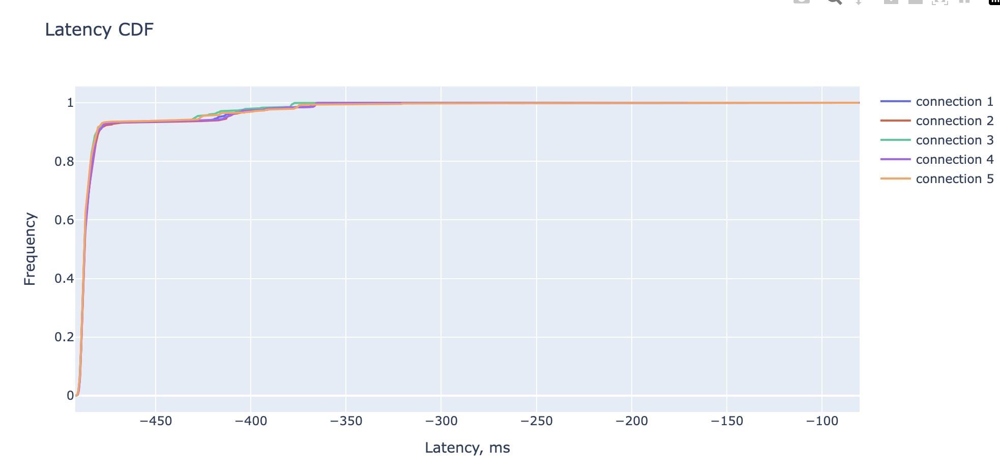

We have negative latencies because of the server time difference. But it does not affect the statistical results.

We can see that the lower the fast connection ratio is the lower the curve is on the CDF graph.



### Mean Z-test:

$$H_0: \mu_1 = \mu_n$$
$$H_1: \mu_1 \neq \mu_n$$

Connection 1 with Connection 2: H0 accepted with pvalue: 0.2740 \
Connection 1 with Connection 3: H0 declined with pvalue: 0.0045 \
Connection 1 with Connection 4: H0 accepted with pvalue: 0.6611 \
Connection 1 with Connection 5: H0 accepted with pvalue: 0.3055

### Levene's test for Variance:

$$H_0: \sigma_1^2 = \sigma_2^2 = \dots = \sigma_5^2$$
$$H_1: \exists i,j: \sigma_i^2 \neq \sigma_j^2$$

Result: $H_0$ declined with pvalue = 0.003725

Tests explanations:
If we look at the distribution graphs we will see there are a lot of statistical outliers that heavily affect the means and the standard deviation.
Here is the distribution:

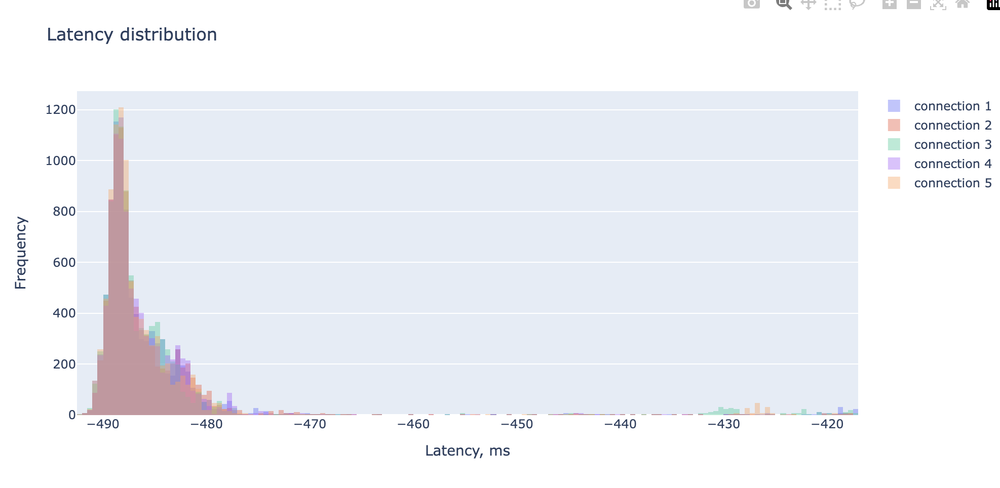

We see that long heavy tail which affects our statistics.


Also here is the time graph.
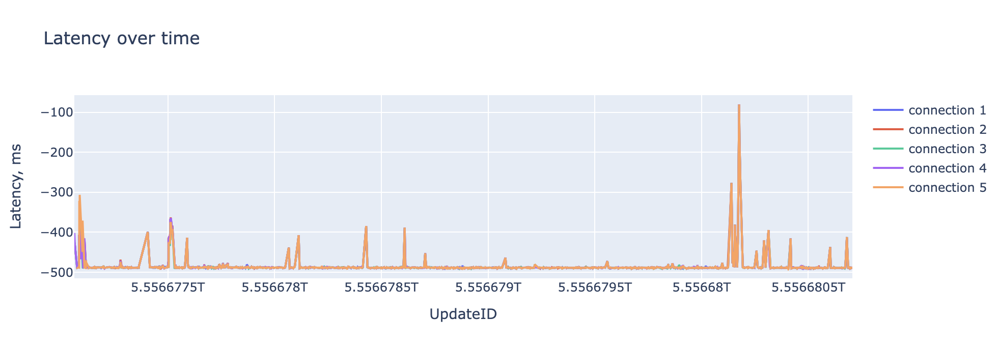
We can see some spikes that act on certain connections.

So the question is why do we have these outliers when collecting data in parallel from one computer?
### Possible reasons
1. Server overload. Binance has tens of thousands of connections and needs to provide data to each one of them. It might be the server problem to process every connection with minimal latencies.
2. Rate limiting on server side. Binance certainly has rate limits that it tracks by IP-address.
3. Server side load balancing. Different connections that I make are probably established with different servers. Different servers may lead to different latencies.
4. Client processing is delayed.
    1. The process in the operating system spent all the allocated CPU time, the context change occurred for a moment. And by the time the process got the CPU back the message was already waiting - the latency increased.
    2. Garbage collectors got in place. Python has a garbage collector to clean unused memory. It can throttle the process a little.
5. Network changes can lead to new hops that increase the latency. Since my computer is far from the data server there are a lot of nodes which the package has to pass to be delivered to my computer. Since I have different connections they might use different routes to deliver packages.
6. Since Websocket uses TCP it could be TCP delivery failures causing TCP retransmissions and increasing the latency.

   
       
  



In [1]:
import aiohttp
import time
import asyncio
from multiprocessing import Process, Queue
import numpy as np
import pandas as pd

import json


def reformat_data(data):
    dfs = []
    for process in data:
        formatted_process_data = []
        for record in process:
            data_json = json.loads(record['msg'].data)
            ts = record['at']
            formatted_process_data.append({'event_ts': data_json['E'], 'received_at': ts, 'update_id': data_json['u']})
        df = pd.DataFrame(formatted_process_data).set_index('update_id')
        df['latency'] = df['received_at'] / 10 ** 6 - df['event_ts']
        dfs.append(df)
    return dfs

def get_fast_ratio(ldfs) -> dict:
    common_df = ldfs[0].copy()[['latency']]
    for i in range(1,len(ldfs)):
        common_df = common_df.join(ldfs[i][['latency']], rsuffix=f'_{i}', how='inner')
    
    common_df['min'] = common_df.min(axis=1)
    latency_ratios = common_df.iloc[:, 0:len(ldfs)].eq(common_df['min'], axis=0).sum(axis=0) / len(common_df)
    return {f'connection_{i+1}': float(latency_ratios.iloc[i]) for i in range(len(latency_ratios))}

## Obtaining Data

## FROM json

In [2]:
import json
from collections import defaultdict
import pandas as pd



with open('latencies.json') as f:
    lats = json.load(f)

data = defaultdict(list)
for record in lats:
    cid = record['connection_id']
    data[cid].append({'update_id': record['update_id'], 'latency': record['latency_ns'] / 10 ** 6})

ldfs = []
for connection in data:
    ldfs.append(pd.DataFrame(data[connection]).set_index('update_id'))

## FROM websockets

In [3]:
# import binance_runner



# amount = 5
# time_seconds = 60

# q = Queue()

# ps = []
# res = []
# print('running')
# for i in range(amount):
#     ps.append(Process(target=binance_runner.run, args=(time_seconds, q, i)))

# for p in ps:
#     p.start()

# print('processes started')
# for p in ps:
#     res.append(q.get())

# for p in ps:
#     p.join()

# print('finished')

# ldfs = reformat_data(res)

# Analysis

In [4]:
get_fast_ratio(ldfs)

{'connection_1': 0.19119699409554483,
 'connection_2': 0.1462157809983897,
 'connection_3': 0.28652710681696186,
 'connection_4': 0.18593666129898015,
 'connection_5': 0.25024154589371983}

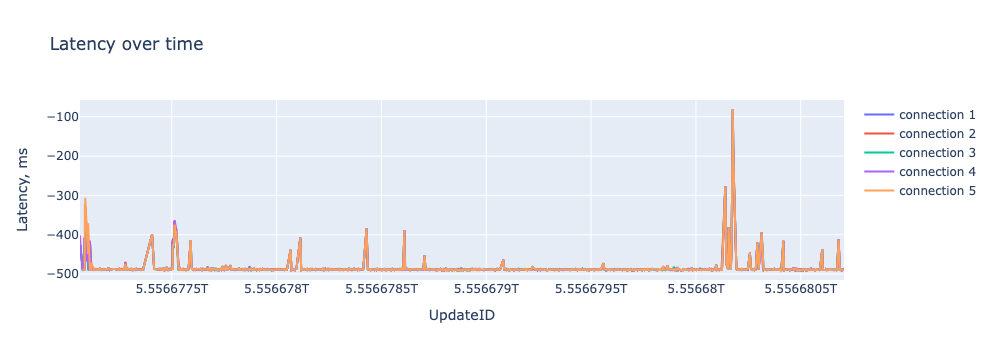

In [5]:
import plotly.graph_objects as go

fig = go.Figure()
i = 1
for df in ldfs:
    fig.add_trace(go.Scatter(x=df.index, y=df['latency'], name=f'connection {i}'))
    i += 1

fig.update_layout(title='Latency over time', 
                  xaxis_title="UpdateID",
                  yaxis_title="Latency, ms",)
fig.show()


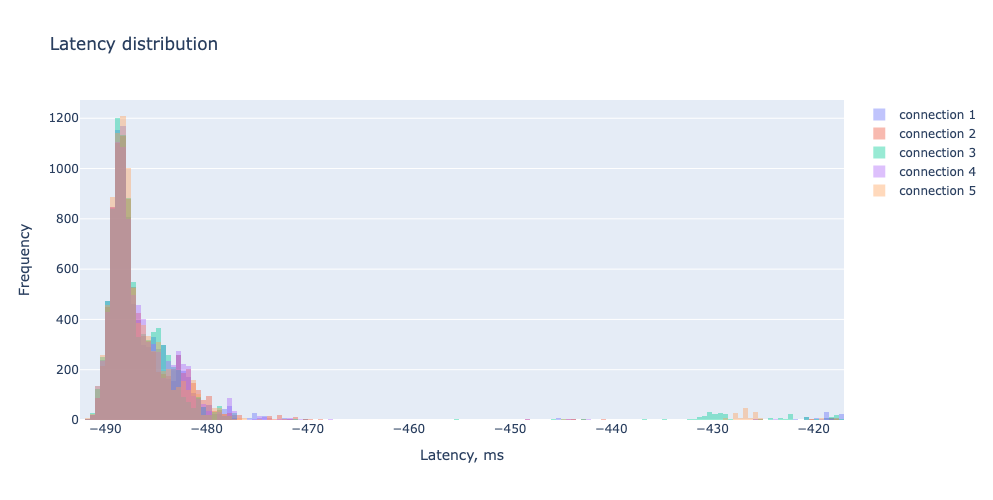

In [6]:
fig = go.Figure()

q = ldfs[0]['latency'].quantile(0.95)

i = 1
for df in ldfs:
    fig.add_trace(go.Histogram(x=df['latency'][df['latency'] < q], nbinsx=300, name=f'connection {i}'))
    i += 1

fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.4)
fig.update_layout(
    title="Latency distribution",
    xaxis_title="Latency, ms",
    yaxis_title="Frequency",
    autosize=False,
    width=1000,
    height=500,
    showlegend=True
)

fig.show()

Asymmetrical. Looks like gamma distribution.

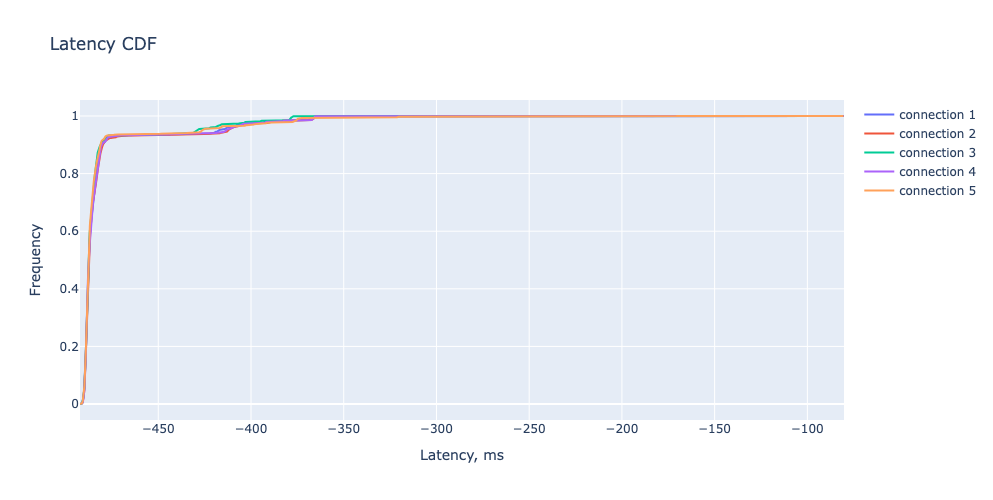

In [7]:
fig = go.Figure()
i = 1


for df in ldfs:
    plot_x = df['latency']
    hist, bin_edges = np.histogram(plot_x, bins=10000, density=True)
    cdf = np.cumsum(hist * np.diff(bin_edges))
    fig.add_trace(go.Scatter(x=bin_edges, y=cdf, name=f'connection {i}'))
    i += 1

fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_layout(
    title="Latency CDF",
    xaxis_title="Latency, ms",
    yaxis_title="Frequency",
    autosize=False,
    width=1000,
    height=500,
    showlegend=True
)

fig.show()

In [8]:
ratios = get_fast_ratio(ldfs)
for con in ratios:
    print(con, f': {ratios[con]:.3f}')


connection_1 : 0.191
connection_2 : 0.146
connection_3 : 0.287
connection_4 : 0.186
connection_5 : 0.250


As we can see the curve that is the lowest on the graph has the lowest fast ratio.

## Friedman Test
$H_0$: there is no significant difference between the dependent groups
$H_1$: there is a significant difference between the dependent groups

In [9]:
from scipy.stats import friedmanchisquare

# Type 1 error
alpha = 0.05

common_df = ldfs[0].copy()
for i in range(1,len(ldfs)):
    common_df = common_df.join(ldfs[i], rsuffix=f'_{i}', how='inner')
latencies = [list(common_df[col]) for col in common_df.columns]
friedman_res = friedmanchisquare(*latencies)

print('-' * 30)
print('Friedman Test')
print('-' * 30)
print('pvalue', friedman_res.pvalue)
if friedman_res.pvalue > alpha:
    print('H0 is accepted')
else:
    print('H0 is declined')


------------------------------
Friedman Test
------------------------------
pvalue 1.4510927828680086e-228
H0 is declined


## Mean Hypothesis testing
We have more than 10000 records.
Definetely not normal distribution.
Z-test will be ok for two-samples tests.
$$H_0 : \mu_1 = \mu_2$$
$$H_1 : \mu_1 \neq \mu_2$$
Using Z-test with CLT:
$$z = \dfrac{\mu_1 - \mu_2}{(\dfrac{s_1^2}{n} + \dfrac{s_2^2}{m})^\frac{1}{2}}$$
$$z \sim N(0,1)$$


## Z-test for means

In [10]:
import numpy as np
from scipy.stats import norm

def get_z_stat(x1: pd.Series, x2: pd.Series) -> float:
    mu1 = x1.mean()
    mu2 = x2.mean()
    
    s1 = x1.std()
    s2 = x2.std()
    
    n = len(x1)
    m = len(x2)
    
    z = (mu1 - mu2) / ((s1**2 / n) + (s2 **2 / m)) ** 0.5
    return float(z)

def z_test(z_stat, alpha=0.05) -> (bool, float):
    left_limit = float(norm.ppf(alpha/2))
    right_limit = - left_limit
    pvalue = norm.cdf(min(z_stat, -z_stat)) * 2
    return left_limit < z_stat < right_limit, pvalue



def plot_z_test(z, alpha):
    x = np.linspace(-3, 3, 100)
    y = norm.pdf(x)
    
    left_limit = norm.ppf(alpha/2)
    right_limit = -left_limit
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x, y=y, name='N(0,1)'))
    fig.add_vline(x=z,line_width=3, line_dash="dash", line_color="green", annotation_text=f'{z:.2f}',annotation_font_size=20,
                  annotation_font_color="green",               annotation_position="bottom right")
    fig.add_vline(x=right_limit, line_dash='dash', line_color='red')
    fig.add_vrect(x0=right_limit, x1=3, fillcolor='red', opacity=0.1, annotation_text=f'{right_limit:.2f}', annotation_font_size=20,
                  annotation_font_color="red",               annotation_position="bottom left")
    fig.add_vline(x=left_limit, line_dash='dash', line_color='red')
    fig.add_vrect(x1=left_limit, x0=-3, fillcolor='red', opacity=0.1, annotation_text=f'{left_limit:.2f}',annotation_font_size=20,
                  annotation_font_color="red",               annotation_position="bottom right")
    fig.update_layout(
        title='Z-test',
        autosize=False,
        width=1000,
        height=500,
        showlegend=True
    )
    fig.show()
    



Testing connection 1 with connection 2
----------------------------------------
pvalue 0.2739819051744272
H0 hypothesis is accepted
----------------------------------------


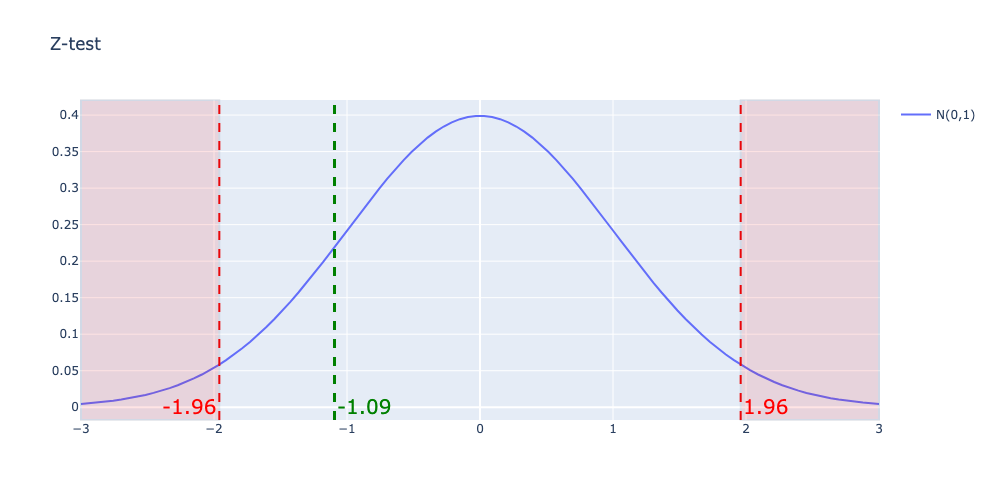



Testing connection 1 with connection 3
----------------------------------------
pvalue 0.004475898616549943
H0 hypothesis is declined
----------------------------------------


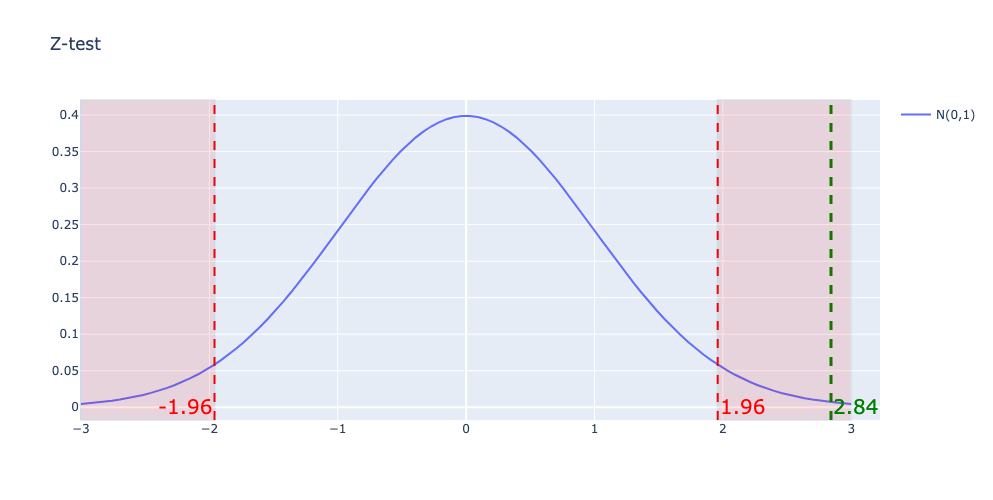



Testing connection 1 with connection 4
----------------------------------------
pvalue 0.6610524492342306
H0 hypothesis is accepted
----------------------------------------


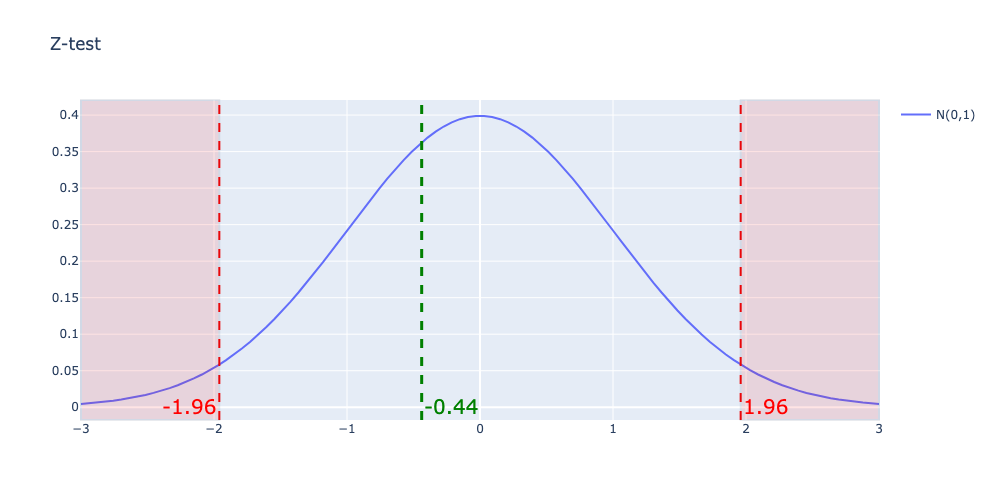



Testing connection 1 with connection 5
----------------------------------------
pvalue 0.30553972551425257
H0 hypothesis is accepted
----------------------------------------


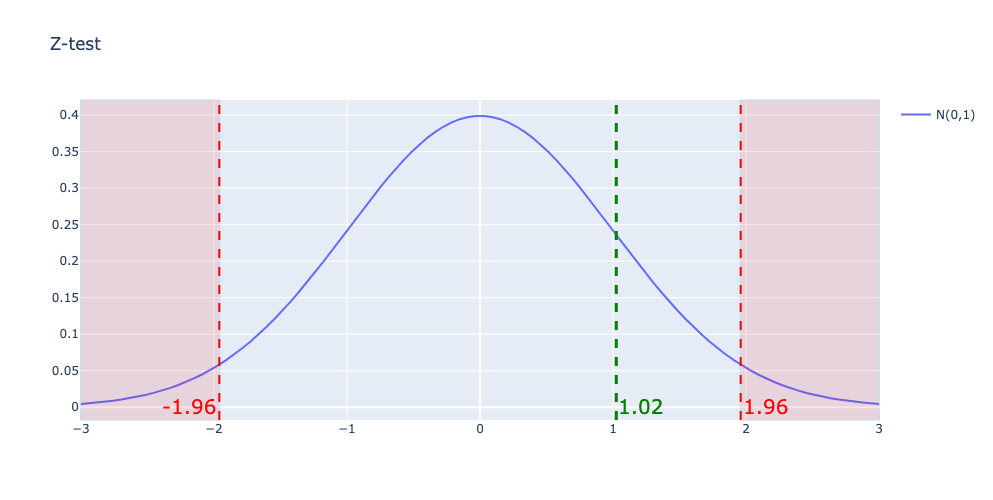

In [11]:


hypothesis_acceptance = dict()
for i in range(1, len(ldfs)):
    z = get_z_stat(ldfs[0]['latency'], ldfs[i]['latency'])
    print('\n')
    print(f'Testing connection 1 with connection {i+1}')
    print('-' * 40)
    is_test_passed, pvalue = z_test(z, alpha)
    hypothesis_acceptance[i+1] = {'passed': is_test_passed, 'pvalue': pvalue}
    print('pvalue', pvalue)
    if is_test_passed:
        print("H0 hypothesis is accepted")
    else:
        print("H0 hypothesis is declined")
    print('-' * 40)
    plot_z_test(z, alpha)


In [12]:
for conn_id, acceptance in hypothesis_acceptance.items():
    print(f'Connection 1 with Connection {conn_id}: {'H0 accepted' if acceptance['passed'] else 'H0 declined'} with pvalue: {acceptance['pvalue']:.4f}')

Connection 1 with Connection 2: H0 accepted with pvalue: 0.2740
Connection 1 with Connection 3: H0 declined with pvalue: 0.0045
Connection 1 with Connection 4: H0 accepted with pvalue: 0.6611
Connection 1 with Connection 5: H0 accepted with pvalue: 0.3055


## Levene's Test for Variances
$$H_0: \sigma_1^2 = \sigma_2^2 = \dots = \sigma_5^2$$
$$H_1: \exists i,j: \sigma_i^2 \neq \sigma_j^2$$

In [13]:
from scipy.stats import levene

levene_res = levene(*latencies)

print('-' * 30)
print('Levene Test')
print('-' * 30)
print('pvalue', levene_res.pvalue)
if levene_res.pvalue > alpha:
    print('H0 is accepted')
else:
    print('H0 is declined')

------------------------------
Levene Test
------------------------------
pvalue 0.003725517973515522
H0 is declined
